In [1]:
import pandas as pd
import numpy as np
from sklearn.metrics import jaccard_score
from sklearn.metrics import pairwise_distances
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn import metrics

In [9]:
from scipy.spatial.distance import cdist 
 
#Function to implement steps given in previous section
def kmeans(x,k, no_of_iterations=5):
    idx = np.random.choice(len(x), k, replace=False)
    #Randomly choosing Centroids 
    centroids = x[idx, :] #Step 1
     
    #finding the distance between centroids and all the data points
    distances = cdist(x, centroids ,'jaccard') #Step 2
     
    #Centroid with the minimum Distance
    points = np.array([np.argmin(i) for i in distances]) #Step 3
     
    #Repeating the above steps for a defined number of iterations
    #Step 4
    for _ in range(no_of_iterations): 
        centroids = []
        for idx in range(k):
            #Updating Centroids by taking mean of Cluster it belongs to
            temp_cent = x[points==idx][np.argmin(cdist(x[points==idx], x[points==idx] ,'jaccard').sum(axis=0))]
            centroids.append(temp_cent)
 
        centroids = np.vstack(centroids) #Updated Centroids 
         
        distances = cdist(x, centroids ,'jaccard')
        points = np.array([np.argmin(i) for i in distances])
         
    return points,centroids

In [10]:
def kmean_inertia(data,k=5,max_iter=10):
        k_means=kmeans(data,k,max_iter)
        cluster=k_means[0]
        centroids=k_means[1]
        Inertia=0
        for i in range(k):
            cluster_k=data[cluster==i]
            cen_k = centroids[i]
            #clus = cluster[i]
            Inertia+=cdist(cluster_k,[cen_k] ,'jaccard').sum(axis=0)
        return Inertia
                
def optimize(data,m,max_iter=10):
    x = []
    for i in range(1,m):
        x.append(kmean_inertia(data,k=i,max_iter=10))
    return x

In [2]:
from google.colab import files
files.upload()

Saving docword.nips.txt to docword.nips.txt


{'docword.nips.txt': b'1 2 1\n1 39 1\n1 42 3\n1 77 1\n1 95 1\n1 96 1\n1 105 1\n1 108 1\n1 133 3\n1 137 2\n1 140 1\n1 149 1\n1 155 1\n1 158 17\n1 169 1\n1 172 4\n1 316 3\n1 365 1\n1 389 1\n1 426 2\n1 428 17\n1 433 2\n1 437 1\n1 478 1\n1 518 1\n1 523 1\n1 532 1\n1 533 1\n1 540 2\n1 542 1\n1 550 1\n1 552 1\n1 574 3\n1 579 1\n1 639 2\n1 653 1\n1 654 1\n1 673 1\n1 675 1\n1 676 2\n1 695 1\n1 697 3\n1 698 1\n1 786 1\n1 822 3\n1 904 2\n1 937 1\n1 941 2\n1 954 2\n1 986 1\n1 987 1\n1 990 3\n1 1056 1\n1 1087 3\n1 1103 1\n1 1135 1\n1 1172 1\n1 1188 1\n1 1213 2\n1 1222 1\n1 1270 1\n1 1282 1\n1 1393 3\n1 1395 2\n1 1398 2\n1 1418 1\n1 1426 1\n1 1482 2\n1 1483 1\n1 1493 1\n1 1497 4\n1 1498 16\n1 1499 1\n1 1500 4\n1 1501 3\n1 1595 1\n1 1614 3\n1 1616 1\n1 1681 1\n1 1759 1\n1 1768 4\n1 1769 1\n1 1772 1\n1 1783 1\n1 1814 1\n1 1824 4\n1 1826 4\n1 1872 1\n1 1873 1\n1 1927 1\n1 1940 1\n1 1943 1\n1 1951 3\n1 1976 2\n1 1978 1\n1 2005 1\n1 2015 2\n1 2042 1\n1 2050 1\n1 2052 3\n1 2054 1\n1 2055 1\n1 2056 1\n1 2

In [3]:
nips_txt = pd.read_csv("docword.nips.txt", delimiter=" ", names=['DocID', 'WordID', 'Freq'])

In [4]:
nips_txt.head()

,DocID,WordID,Freq
0,1,2,1
1,1,39,1
2,1,42,3
3,1,77,1
4,1,95,1


In [5]:
nips_DocID_count=nips_txt['DocID'].max()
nips_WordID_count=nips_txt['WordID'].max()

In [6]:
nips_matrix=np.zeros([nips_WordID_count,nips_DocID_count])  

In [7]:
for i in range(nips_txt.shape[0]):
  d_pos = nips_txt.DocID[i]
  w_pos = nips_txt.WordID[i]
  nips_matrix[w_pos-1][d_pos-1]=nips_txt.Freq[i]

In [8]:
nips_matrix_sparse=np.where(nips_matrix==0,0,1)  
nips_matrix_sparse.shape

(12419, 1500)

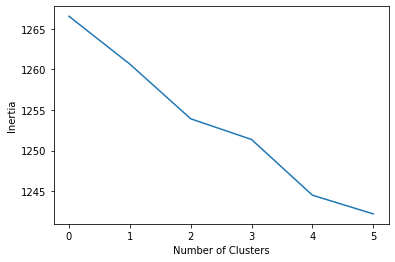

In [16]:
%%time
y=optimize(np.transpose(nips_matrix_sparse)[0:1500],7,50)
plt.plot(list(range(0,6)),y)
plt.xlabel("Number of Clusters")
plt.ylabel("Inertia")
plt.show()


In [11]:
label=kmeans(np.transpose(nips_matrix_sparse)[0:1500],3,20)

In [12]:
label

(array([0, 2, 0, ..., 1, 1, 1]), array([[0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0]]))

In [28]:
nips_finalclustering=pd.DataFrame(label[0])
nips_finalcentroids=pd.DataFrame(label[1])

In [29]:
nips_finalclustering.to_csv("nips_finalclustering.csv")
nips_finalcentroids.to_csv("nips_finalcentroids.csv")

In [30]:
files.download('nips_finalclustering.csv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [31]:
files.download('nips_finalcentroids.csv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>